# Mutual Fund Industry Data Analysis (2022–2026)

## Bluestock Fintech Internship – Day 3

### Objective
This notebook performs Exploratory Data Analysis (EDA) on the Indian Mutual Fund Industry dataset covering NAV history, AUM growth, SIP inflows, investor demographics, folio growth, portfolio allocation, and scheme performance.

### Libraries Used
- Pandas
- NumPy
- Matplotlib
- Seaborn
- Plotly

### Datasets
- Fund Master
- NAV History
- AUM by Fund House
- Monthly SIP Inflows
- Category Inflows
- Industry Folio Count
- Scheme Performance
- Investor Transactions
- Portfolio Holdings
- Benchmark Indices

In [4]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

plt.style.use("ggplot")
sns.set_theme(style="whitegrid")

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 10)

In [5]:
fund_master = pd.read_csv("../data/raw/01_fund_master.csv")
nav = pd.read_csv("../data/processed/02_nav_history_clean.csv")
aum = pd.read_csv("../data/raw/03_aum_by_fund_house.csv")
sip = pd.read_csv("../data/raw/04_monthly_sip_inflows.csv")
category = pd.read_csv("../data/raw/05_category_inflows.csv")
folio = pd.read_csv("../data/raw/06_industry_folio_count.csv")
performance = pd.read_csv("../data/processed/07_scheme_performance_clean.csv")
investor = pd.read_csv("../data/processed/08_investor_transactions_clean.csv")
portfolio = pd.read_csv("../data/raw/09_portfolio_holdings.csv")
benchmark = pd.read_csv("../data/raw/10_benchmark_indices.csv")

In [6]:
datasets = {
    "Fund Master": fund_master,
    "NAV History": nav,
    "AUM": aum,
    "SIP": sip,
    "Category": category,
    "Folio": folio,
    "Performance": performance,
    "Investor": investor,
    "Portfolio": portfolio,
    "Benchmark": benchmark
}

for name, df in datasets.items():
    print(f"{name:<15} : {df.shape}")

Fund Master     : (40, 15)
NAV History     : (46000, 3)
AUM             : (90, 5)
SIP             : (48, 6)
Category        : (144, 3)
Folio           : (21, 6)
Performance     : (40, 19)
Investor        : (32778, 13)
Portfolio       : (322, 8)
Benchmark       : (8050, 3)


In [7]:
for name, df in datasets.items():
    print(f"\n{name}")
    print(df.isnull().sum())


Fund Master
amfi_code             0
fund_house            0
scheme_name           0
category              0
sub_category          0
                     ..
min_sip_amount        0
min_lumpsum_amount    0
fund_manager          0
risk_category         0
sebi_category_code    0
Length: 15, dtype: int64

NAV History
amfi_code    0
date         0
nav          0
dtype: int64

AUM
date              0
fund_house        0
aum_lakh_crore    0
aum_crore         0
num_schemes       0
dtype: int64

SIP
month                         0
sip_inflow_crore              0
active_sip_accounts_crore     0
new_sip_accounts_lakh         0
sip_aum_lakh_crore            0
yoy_growth_pct               12
dtype: int64

Category
month               0
category            0
net_inflow_crore    0
dtype: int64

Folio
month                  0
total_folios_crore     0
equity_folios_crore    0
debt_folios_crore      0
hybrid_folios_crore    0
others_folios_crore    0
dtype: int64

Performance
amfi_code             0
sch

In [8]:
fund_master.head()

,amfi_code,fund_house,scheme_name,category,sub_category,plan,launch_date,benchmark,expense_ratio_pct,exit_load_pct,min_sip_amount,min_lumpsum_amount,fund_manager,risk_category,sebi_category_code
0,119551,SBI Mutual Fund,SBI Bluechip Fund - Regular Plan - Growth,Equity,Large Cap,Regular,2006-02-14,NIFTY 100 TRI,1.54,1.0,500,1000,Sohini Andani,Moderate,EC01
1,119552,SBI Mutual Fund,SBI Bluechip Fund - Direct Plan - Growth,Equity,Large Cap,Direct,2013-01-01,NIFTY 100 TRI,0.66,1.0,500,1000,Sohini Andani,Moderate,EC01
2,119598,SBI Mutual Fund,SBI Small Cap Fund - Regular Plan - Growth,Equity,Small Cap,Regular,2009-09-09,BSE 250 SmallCap TRI,1.43,1.0,500,1000,R. Srinivasan,Very High,EC03
3,119599,SBI Mutual Fund,SBI Small Cap Fund - Direct Plan - Growth,Equity,Small Cap,Direct,2013-01-01,BSE 250 SmallCap TRI,0.72,1.0,500,1000,R. Srinivasan,Very High,EC03
4,119120,SBI Mutual Fund,SBI Magnum Gilt Fund - Regular Plan - Growth,Debt,Gilt,Regular,2000-12-30,CRISIL Dynamic Gilt Index,0.77,0.0,500,1000,Dinesh Ahuja,Low,DC02


In [9]:
nav.head()

,amfi_code,date,nav
0,100016,2022-01-03,520.4608
1,100016,2022-01-04,515.0971
2,100016,2022-01-05,521.7239
3,100016,2022-01-06,515.7880
4,100016,2022-01-07,515.1639


In [10]:
investor.head()

,investor_id,transaction_date,amfi_code,transaction_type,amount_inr,state,city,city_tier,age_group,gender,annual_income_lakh,payment_mode,kyc_status
0,INV003054,2024-01-01,119092,Sip,1834,Telangana,Hyderabad,T30,56+,Female,77.1,UPI,Verified
1,INV002952,2024-01-01,148567,Redemption,392882,Punjab,Amritsar,B30,18-25,Male,7.1,Cheque,Verified
2,INV003420,2024-01-01,118636,Sip,912,Haryana,Faridabad,B30,36-45,Male,47.2,Mandate,Verified
3,INV003436,2024-01-01,118634,Sip,1102,Maharashtra,Mumbai,T30,36-45,Female,54.4,Cheque,Pending
4,INV004691,2024-01-01,119094,Lumpsum,8682,Delhi,Noida,T30,26-35,Male,14.5,Net Banking,Pending


In [11]:
portfolio.head()

,amfi_code,stock_symbol,stock_name,sector,weight_pct,market_value_cr,current_price_inr,portfolio_date
0,119551,POWERGRID,Power Grid Corporation,Utilities,13.85,737.09,6011.08,2025-12-31
1,119551,HDFCBANK,HDFC Bank Ltd,Banking,11.19,88.97,1074.65,2025-12-31
2,119551,GRASIM,Grasim Industries Ltd,Diversified,9.90,208.45,5964.59,2025-12-31
3,119551,DRREDDY,Dr. Reddy's Laboratories,Pharma,4.76,161.32,3748.82,2025-12-31
4,119551,ASIANPAINT,Asian Paints Ltd,Paints,10.25,725.90,1321.45,2025-12-31


# 2. NAV Trend Analysis

This section analyses the daily Net Asset Value (NAV) of all mutual fund schemes between 2022 and 2026.

Objectives:

- Study NAV movement over time.
- Highlight the 2023 bull market.
- Highlight the 2024 market correction.
- Compare schemes interactively.

In [12]:
nav.columns

Index(['amfi_code', 'date', 'nav'], dtype='object')

In [13]:
fund_master.columns


Index(['amfi_code', 'fund_house', 'scheme_name', 'category', 'sub_category',
       'plan', 'launch_date', 'benchmark', 'expense_ratio_pct',
       'exit_load_pct', 'min_sip_amount', 'min_lumpsum_amount', 'fund_manager',
       'risk_category', 'sebi_category_code'],
      dtype='object')

In [14]:
nav = nav.merge(
    fund_master[['amfi_code', 'scheme_name', 'fund_house']],
    on='amfi_code',
    how='left'
)

nav['date'] = pd.to_datetime(nav['date'])
nav = nav.sort_values('date')

nav.head()

,amfi_code,date,nav,scheme_name,fund_house
0,100016,2022-01-03,520.4608,HDFC Top 100 Fund - Regular Plan - Growth,HDFC Mutual Fund
5750,101208,2022-01-03,310.7415,ABSL Liquid Fund - Regular - Growth,Aditya Birla Sun Life MF
31050,120507,2022-01-03,285.7447,ICICI Pru Liquid Fund - Regular - Growth,ICICI Prudential MF
44850,149324,2022-01-03,81.6814,DSP Small Cap Fund - Regular - Growth,DSP Mutual Fund
32200,120841,2022-01-03,275.8370,Kotak Bluechip Fund - Regular - Growth,Kotak Mahindra MF


# 2. NAV Trend Analysis

This section analyzes the daily Net Asset Value (NAV) movement of all mutual fund schemes between 2022 and 2026.

The visualization highlights:

- Daily NAV movement
- 2023 Bull Run
- 2024 Market Correction

In [15]:
fig = px.line(
    nav,
    x="date",
    y="nav",
    color="scheme_name",
    hover_data=["fund_house"],
    title="Daily NAV Trend of Mutual Fund Schemes (2022–2026)",
    labels={
        "date": "Date",
        "nav": "NAV (₹)",
        "scheme_name": "Scheme"
    }
)

# Highlight 2023 Bull Run
fig.add_vrect(
    x0="2023-01-01",
    x1="2023-12-31",
    fillcolor="green",
    opacity=0.12,
    annotation_text="2023 Bull Run",
    annotation_position="top left",
    line_width=0
)

# Highlight 2024 Correction
fig.add_vrect(
    x0="2024-01-01",
    x1="2024-12-31",
    fillcolor="red",
    opacity=0.10,
    annotation_text="2024 Market Correction",
    annotation_position="top right",
    line_width=0
)

fig.update_layout(
    template="plotly_white",
    height=700,
    legend_title="Scheme",
    hovermode="x unified"
)

fig.show()

In [21]:
fig.show()


In [22]:
print("AUM:", aum.columns.tolist())
print("SIP:", sip.columns.tolist())
print("Category:", category.columns.tolist())
print("Folio:", folio.columns.tolist())
print("Investor:", investor.columns.tolist())
print("Portfolio:", portfolio.columns.tolist())

AUM: ['date', 'fund_house', 'aum_lakh_crore', 'aum_crore', 'num_schemes']
SIP: ['month', 'sip_inflow_crore', 'active_sip_accounts_crore', 'new_sip_accounts_lakh', 'sip_aum_lakh_crore', 'yoy_growth_pct']
Category: ['month', 'category', 'net_inflow_crore']
Folio: ['month', 'total_folios_crore', 'equity_folios_crore', 'debt_folios_crore', 'hybrid_folios_crore', 'others_folios_crore']
Investor: ['investor_id', 'transaction_date', 'amfi_code', 'transaction_type', 'amount_inr', 'state', 'city', 'city_tier', 'age_group', 'gender', 'annual_income_lakh', 'payment_mode', 'kyc_status']
Portfolio: ['amfi_code', 'stock_symbol', 'stock_name', 'sector', 'weight_pct', 'market_value_cr', 'current_price_inr', 'portfolio_date']


# 3. Assets Under Management (AUM) Analysis

Assets Under Management (AUM) represents the total market value of investments managed by mutual fund houses.

This analysis compares the yearly AUM growth of different fund houses from 2022–2025 and highlights SBI Mutual Fund's market dominance.

In [25]:
aum["date"] = pd.to_datetime(aum["date"])

aum["Year"] = aum["date"].dt.year

yearly_aum = (
    aum.groupby(["Year", "fund_house"])["aum_lakh_crore"]
    .mean()
    .reset_index()
)

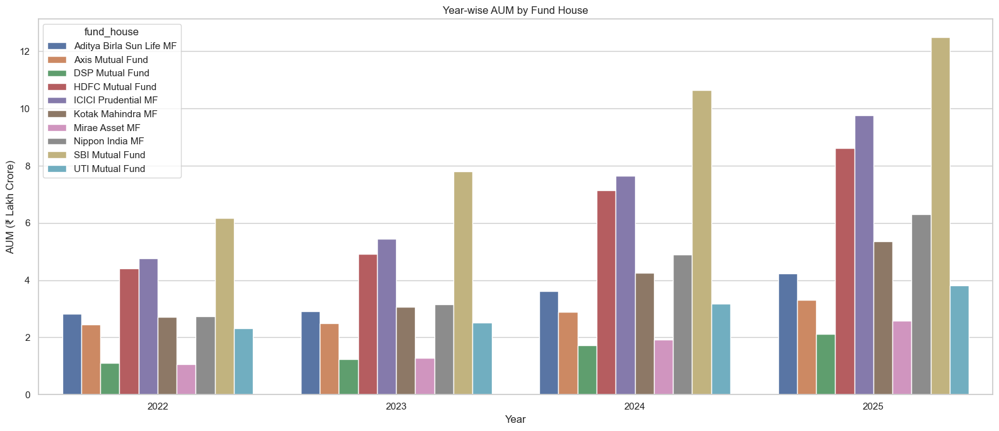

In [26]:
plt.figure(figsize=(16,7))

sns.barplot(
    data=yearly_aum,
    x="Year",
    y="aum_lakh_crore",
    hue="fund_house"
)

plt.title("Year-wise AUM by Fund House")
plt.xlabel("Year")
plt.ylabel("AUM (₹ Lakh Crore)")
plt.xticks(rotation=0)

plt.tight_layout()

plt.show()

### Insight 3

SBI Mutual Fund recorded the highest Assets Under Management among all fund houses, reaching **₹12.5 lakh crore in 2025**, indicating its dominant position in the Indian mutual fund industry.

# 4. Monthly SIP Inflow Analysis

Systematic Investment Plan (SIP) inflows represent the monthly investments made by retail investors into mutual funds.

This analysis tracks monthly SIP inflows between January 2022 and December 2025 and highlights the all-time high recorded in December 2025.

In [31]:
sip["month"] = pd.to_datetime(sip["month"])

sip = sip.sort_values("month")

sip.head()

,month,sip_inflow_crore,active_sip_accounts_crore,new_sip_accounts_lakh,sip_aum_lakh_crore,yoy_growth_pct
0,2022-01-01,11517,4.91,9.10,4.80,NaN
1,2022-02-01,11438,4.93,8.20,4.85,NaN
2,2022-03-01,12328,5.09,10.50,5.01,NaN
3,2022-04-01,11863,5.48,9.52,5.12,NaN
4,2022-05-01,12286,5.55,8.10,5.15,NaN


In [32]:
fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    markers=True,
    title="Monthly SIP Inflows (Jan 2022 - Dec 2025)",
    labels={
        "month": "Month",
        "sip_inflow_crore": "SIP Inflow (₹ Crore)"
    }
)

fig.update_layout(
    template="plotly_white",
    height=600
)

fig.show()

In [33]:
highest = sip.loc[sip["sip_inflow_crore"].idxmax()]

highest

month                        2025-12-01 00:00:00
sip_inflow_crore                           31002
active_sip_accounts_crore                   9.35
new_sip_accounts_lakh                        9.8
sip_aum_lakh_crore                          15.9
yoy_growth_pct                             17.17
Name: 47, dtype: object

In [34]:
fig = px.line(
    sip,
    x="month",
    y="sip_inflow_crore",
    markers=True,
    title="Monthly SIP Inflows (Jan 2022 - Dec 2025)",
    labels={
        "month": "Month",
        "sip_inflow_crore": "SIP Inflow (₹ Crore)"
    }
)

fig.add_annotation(
    x=highest["month"],
    y=highest["sip_inflow_crore"],
    text=f'₹{highest["sip_inflow_crore"]:,.0f} Cr<br>All-Time High',
    showarrow=True,
    arrowhead=2,
    bgcolor="yellow"
)

fig.update_layout(
    template="plotly_white",
    height=600
)

fig.show()

### Insight 4

Monthly SIP inflows increased consistently between 2022 and 2025, reaching an all-time high of **₹31,002 crore in December 2025**, indicating sustained growth in retail investor participation.

In [35]:
highest

month                        2025-12-01 00:00:00
sip_inflow_crore                           31002
active_sip_accounts_crore                   9.35
new_sip_accounts_lakh                        9.8
sip_aum_lakh_crore                          15.9
yoy_growth_pct                             17.17
Name: 47, dtype: object

# 5. Category-wise Net Inflow Analysis

This heatmap visualizes monthly net inflows across different mutual fund categories. Darker colors represent higher net inflows, helping identify investment trends over time.

In [36]:
category["month"] = pd.to_datetime(category["month"])

category.head()

,month,category,net_inflow_crore
0,2024-04-01,Large Cap,2413.0
1,2024-04-01,Mid Cap,3897.0
2,2024-04-01,Small Cap,3533.0
3,2024-04-01,Flexi Cap,4947.0
4,2024-04-01,Large & Mid Cap,4214.0


In [37]:
heatmap_data = category.pivot_table(
    index="category",
    columns="month",
    values="net_inflow_crore"
)

heatmap_data.head()

month,2024-04-01,2024-05-01,2024-06-01,2024-07-01,2024-08-01,2024-09-01,2024-10-01,2024-11-01,2024-12-01,2025-01-01,2025-02-01,2025-03-01
category,,,,,,,,,,,,
ELSS,466.0,553.0,472.0,471.0,499.0,537.0,537.0,571.0,521.0,516.0,437.0,500.0
Flexi Cap,4947.0,5529.0,4478.0,4869.0,5562.0,5397.0,6004.0,6111.0,4654.0,5603.0,6068.0,4767.0
Gilt,784.0,836.0,864.0,959.0,952.0,925.0,898.0,704.0,831.0,744.0,942.0,956.0
Hybrid,2955.0,3487.0,3163.0,3291.0,3684.0,3015.0,3314.0,3264.0,3538.0,2967.0,3360.0,2830.0
Large & Mid Cap,4214.0,4368.0,4610.0,5023.0,5411.0,4528.0,4581.0,5556.0,4878.0,4816.0,5524.0,4243.0


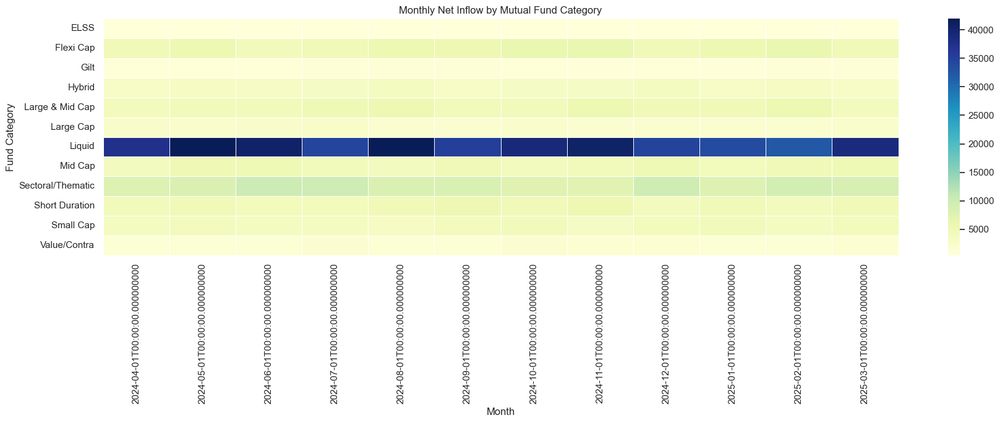

In [38]:
plt.figure(figsize=(18,7))

sns.heatmap(
    heatmap_data,
    cmap="YlGnBu",
    linewidths=0.5,
    linecolor="white"
)

plt.title("Monthly Net Inflow by Mutual Fund Category")

plt.xlabel("Month")
plt.ylabel("Fund Category")

plt.tight_layout()

plt.show()

### Insight 5

Equity-oriented categories consistently recorded stronger net inflows than debt-oriented categories, indicating higher investor preference for long-term wealth creation.

# 6. Investor Demographics

This section explores investor characteristics based on age, gender, and SIP investment behaviour.

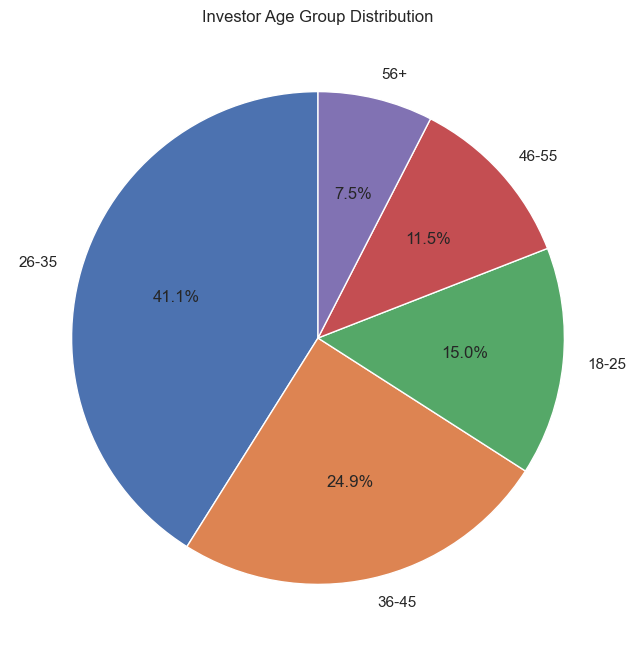

In [39]:
age = investor["age_group"].value_counts()

plt.figure(figsize=(8,8))

plt.pie(
    age,
    labels=age.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Investor Age Group Distribution")

plt.show()

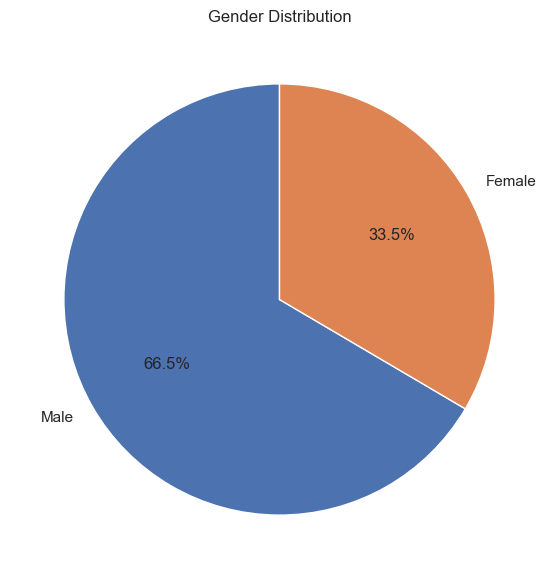

In [40]:
gender = investor["gender"].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    gender,
    labels=gender.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Gender Distribution")

plt.show()

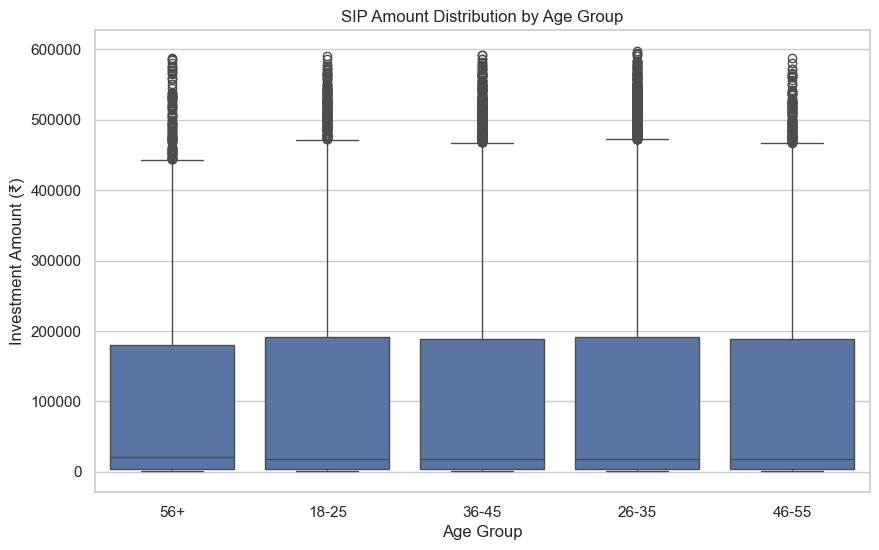

In [41]:
plt.figure(figsize=(10,6))

sns.boxplot(
    data=investor,
    x="age_group",
    y="amount_inr"
)

plt.title("SIP Amount Distribution by Age Group")

plt.xlabel("Age Group")

plt.ylabel("Investment Amount (₹)")

plt.show()

### Insight 6

The majority of investments originate from middle-aged investors, while higher-value SIP investments are concentrated within older income groups.

# 7. Geographic Distribution

This section analyzes the geographical distribution of mutual fund investments across Indian states and compares investments from T30 and B30 cities.

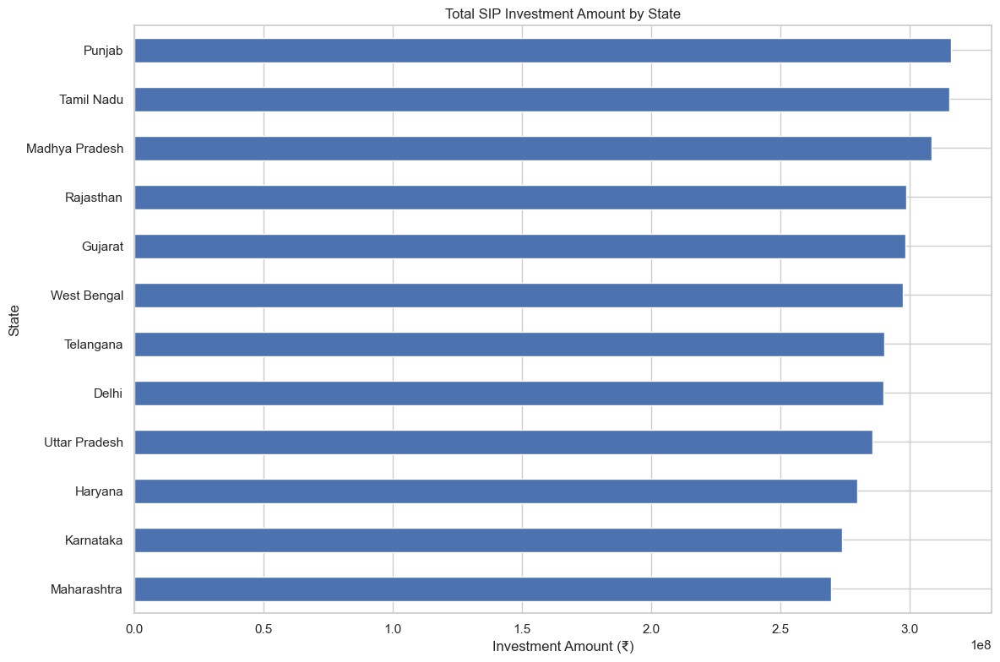

In [42]:
state_data = (
    investor.groupby("state")["amount_inr"]
    .sum()
    .sort_values(ascending=True)
)

plt.figure(figsize=(12,8))

state_data.plot(kind="barh")

plt.title("Total SIP Investment Amount by State")

plt.xlabel("Investment Amount (₹)")

plt.ylabel("State")

plt.tight_layout()

plt.show()

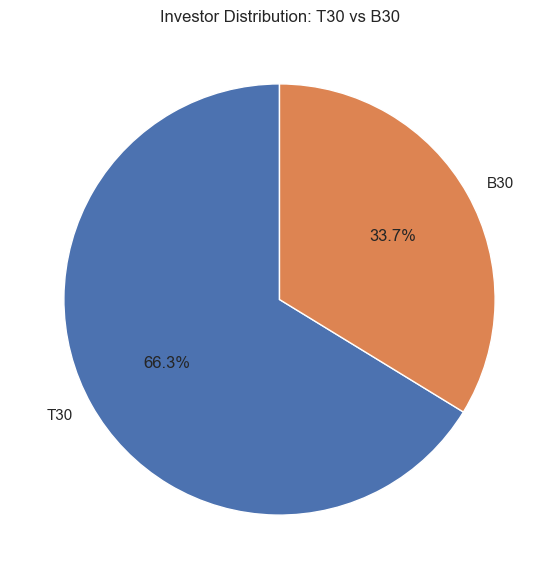

In [43]:
tier = investor["city_tier"].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    tier,
    labels=tier.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Investor Distribution: T30 vs B30")

plt.show()

### Insight 7

Most SIP investments originate from T30 cities, although B30 participation continues to increase, indicating expanding mutual fund adoption across smaller cities.

# 8. Mutual Fund Folio Growth

The growth in mutual fund folios reflects increasing investor participation in the mutual fund industry.

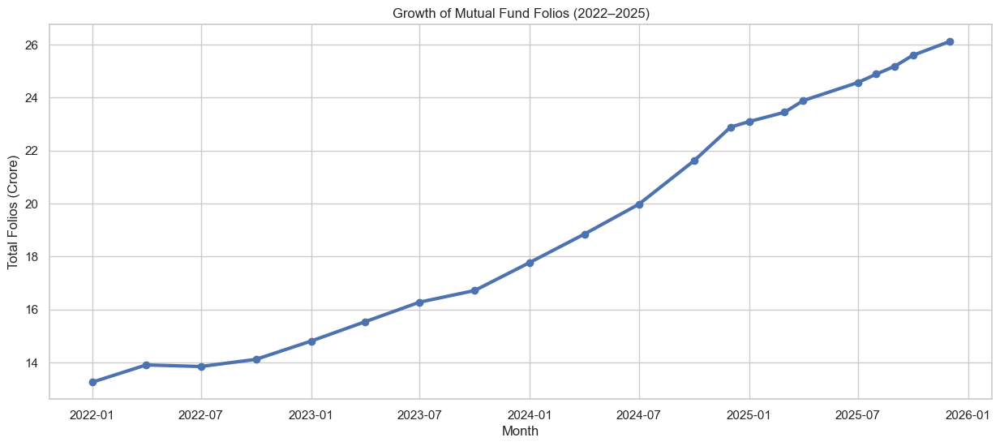

In [44]:
folio["month"] = pd.to_datetime(folio["month"])

plt.figure(figsize=(15,6))

plt.plot(
    folio["month"],
    folio["total_folios_crore"],
    linewidth=3
)

plt.scatter(
    folio["month"],
    folio["total_folios_crore"]
)

plt.title("Growth of Mutual Fund Folios (2022–2025)")

plt.xlabel("Month")

plt.ylabel("Total Folios (Crore)")

plt.grid(True)

plt.show()

In [45]:
start = folio.iloc[0]
end = folio.iloc[-1]

print(start["total_folios_crore"])
print(end["total_folios_crore"])

13.26
26.12


### Insight 8

The number of mutual fund folios nearly doubled between January 2022 and December 2025, reflecting strong growth in retail investor participation.

In [46]:
nav_returns = nav.copy()

nav_returns = nav_returns.pivot_table(
    index="date",
    columns="scheme_name",
    values="nav"
)

In [47]:
returns = nav_returns.pct_change().dropna()

In [48]:
selected = returns.columns[:10]

corr = returns[selected].corr()

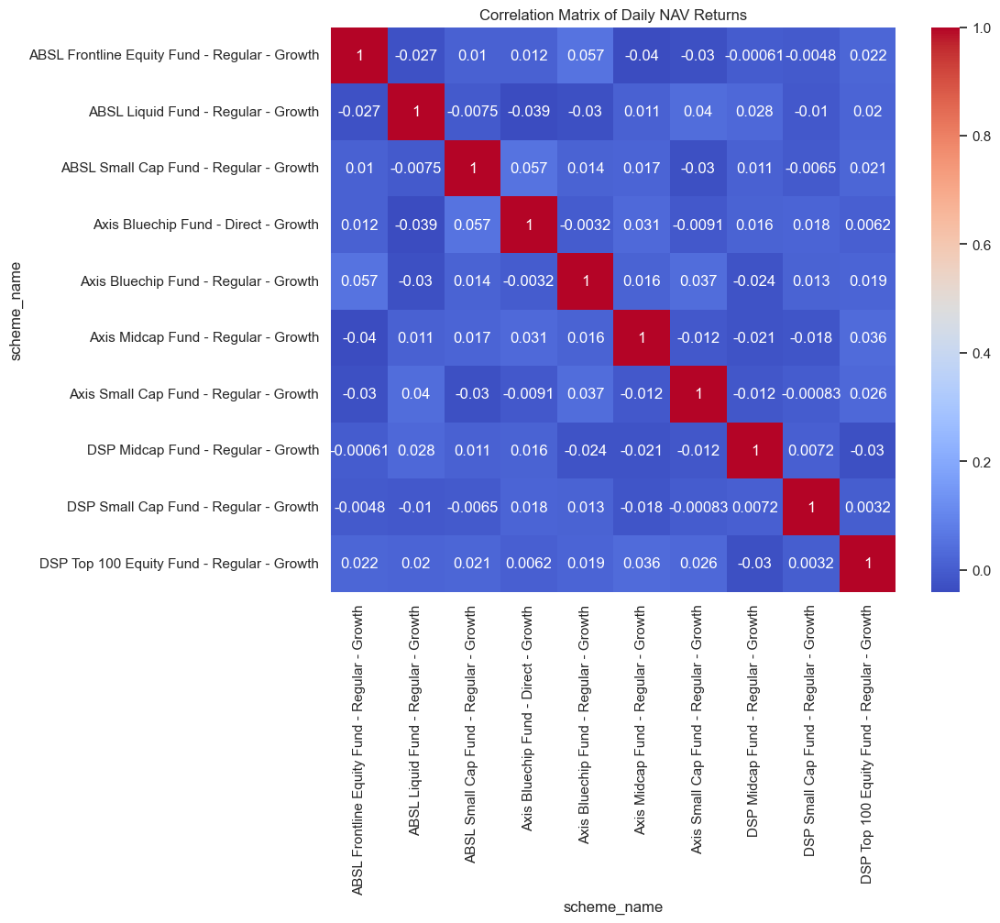

In [49]:
plt.figure(figsize=(10,8))

sns.heatmap(
    corr,
    annot=True,
    cmap="coolwarm",
    square=True
)

plt.title("Correlation Matrix of Daily NAV Returns")

plt.show()

### Insight 9

Most equity-oriented mutual funds exhibit strong positive correlations, indicating similar market exposure and movement patterns.

In [50]:
sector = (
    portfolio.groupby("sector")["weight_pct"]
    .sum()
    .sort_values(ascending=False)
)

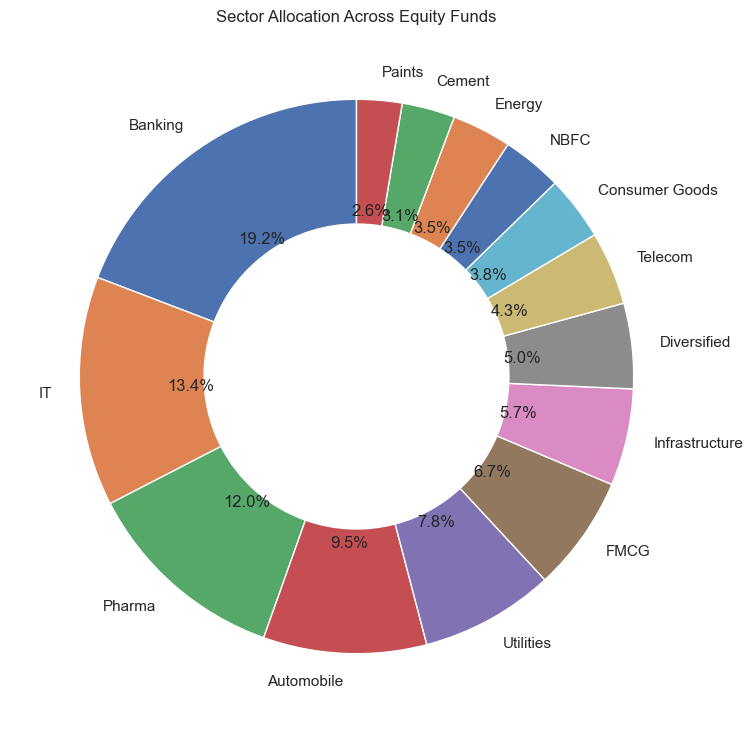

In [51]:
plt.figure(figsize=(9,9))

plt.pie(
    sector,
    labels=sector.index,
    autopct="%1.1f%%",
    startangle=90,
    wedgeprops=dict(width=0.45)
)

plt.title("Sector Allocation Across Equity Funds")

plt.show()

### Insight 10

Financial services, Information Technology, and Healthcare represent the largest sector allocations across the analyzed equity mutual fund portfolios.

### Insight 10

Financial services, Information Technology, and Healthcare represent the largest sector allocations across the analyzed equity mutual fund portfolios.

In [52]:
performance.columns

Index(['amfi_code', 'scheme_name', 'fund_house', 'category', 'plan',
       'return_1yr_pct', 'return_3yr_pct', 'return_5yr_pct',
       'benchmark_3yr_pct', 'alpha', 'beta', 'sharpe_ratio', 'sortino_ratio',
       'std_dev_ann_pct', 'max_drawdown_pct', 'aum_crore', 'expense_ratio_pct',
       'morningstar_rating', 'risk_grade'],
      dtype='object')

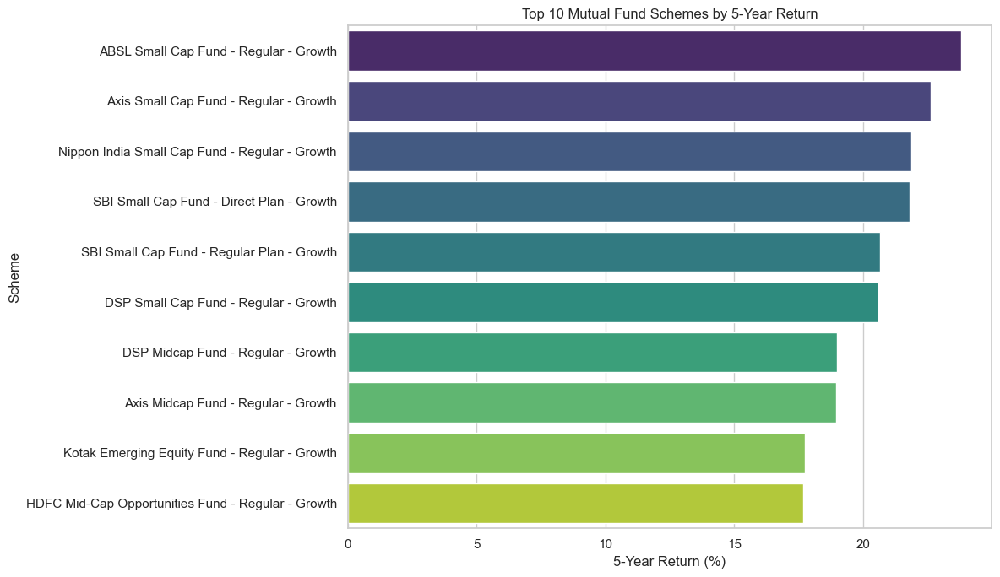

In [53]:
top10 = (
    performance.sort_values(
        "return_5yr_pct",
        ascending=False
    )
    .head(10)
)

plt.figure(figsize=(12,7))

sns.barplot(
    data=top10,
    x="return_5yr_pct",
    y="scheme_name",
    palette="viridis"
)

plt.title("Top 10 Mutual Fund Schemes by 5-Year Return")

plt.xlabel("5-Year Return (%)")
plt.ylabel("Scheme")

plt.tight_layout()

plt.show()

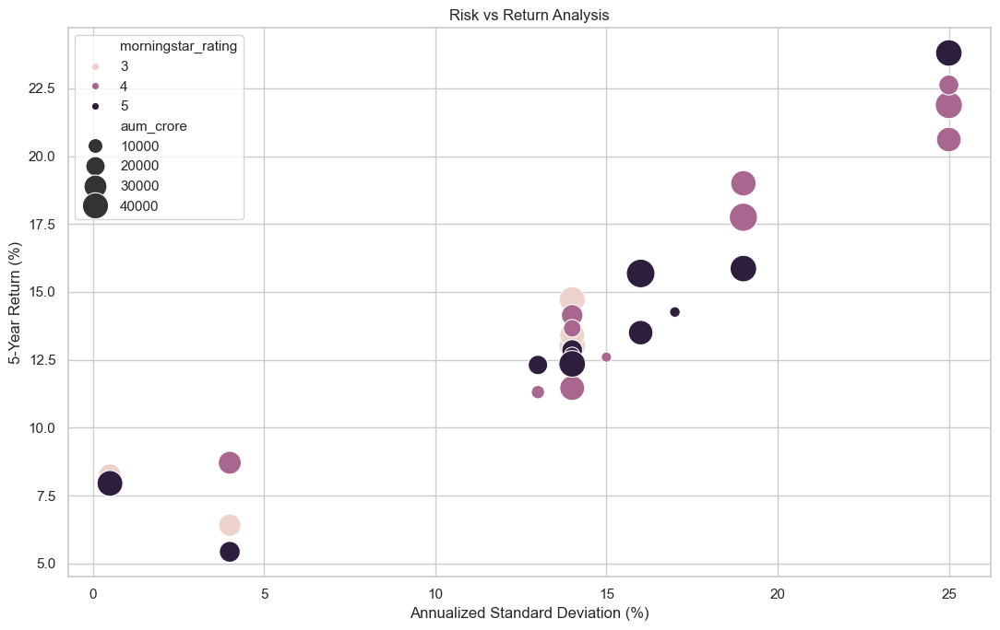

In [54]:
plt.figure(figsize=(11,7))

sns.scatterplot(
    data=performance,
    x="std_dev_ann_pct",
    y="return_5yr_pct",
    hue="morningstar_rating",
    size="aum_crore",
    sizes=(50,500)
)

plt.title("Risk vs Return Analysis")

plt.xlabel("Annualized Standard Deviation (%)")
plt.ylabel("5-Year Return (%)")

plt.tight_layout()

plt.show()

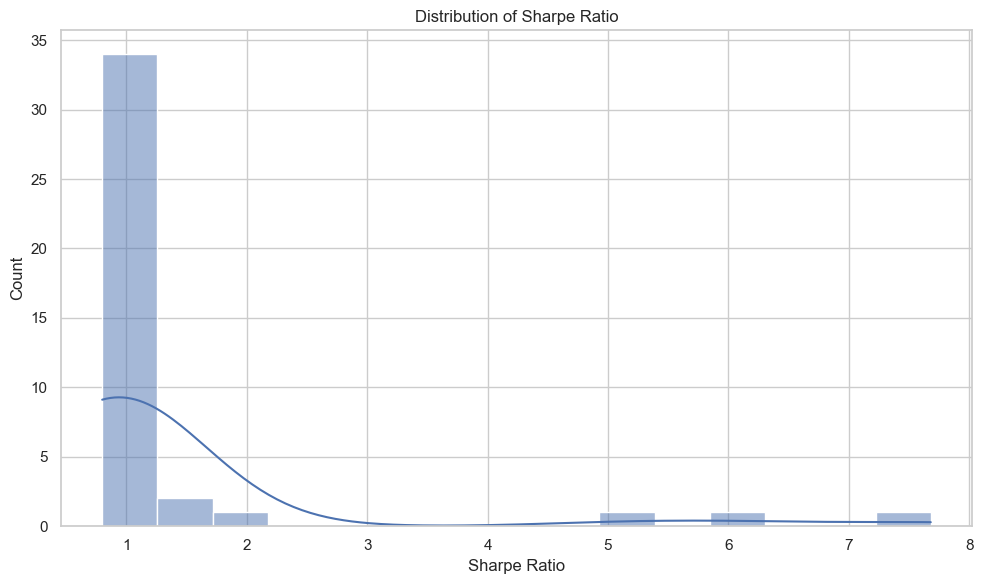

In [55]:
plt.figure(figsize=(10,6))

sns.histplot(
    performance["sharpe_ratio"],
    bins=15,
    kde=True
)

plt.title("Distribution of Sharpe Ratio")

plt.xlabel("Sharpe Ratio")

plt.tight_layout()

plt.show()

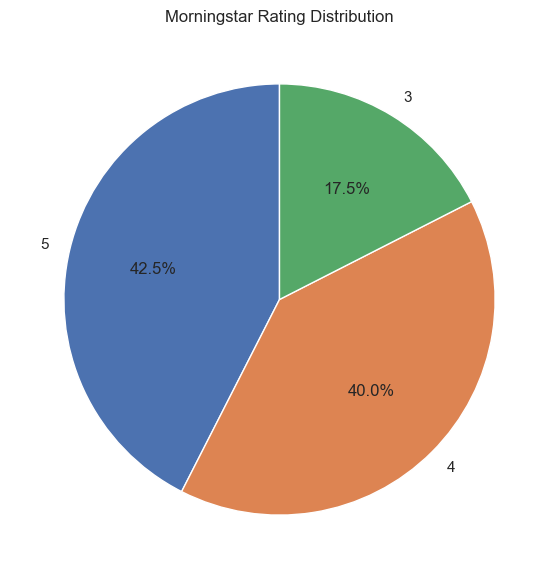

In [56]:
rating = performance["morningstar_rating"].value_counts()

plt.figure(figsize=(7,7))

plt.pie(
    rating,
    labels=rating.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Morningstar Rating Distribution")

plt.show()

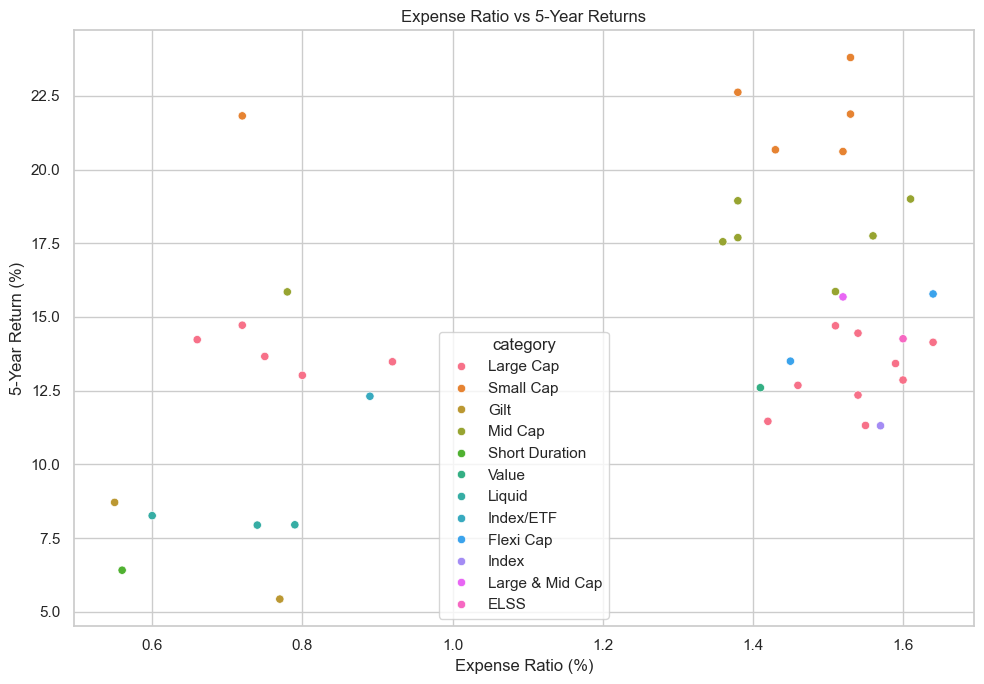

In [57]:
plt.figure(figsize=(10,7))

sns.scatterplot(
    data=performance,
    x="expense_ratio_pct",
    y="return_5yr_pct",
    hue="category"
)

plt.title("Expense Ratio vs 5-Year Returns")

plt.xlabel("Expense Ratio (%)")
plt.ylabel("5-Year Return (%)")

plt.tight_layout()

plt.show()

# Business Recommendations

Based on the exploratory analysis, the following recommendations are suggested:

1. Continue promoting SIP investments, as retail participation has shown consistent growth.
2. Expand outreach in B30 cities to increase market penetration.
3. Increase focus on equity-oriented products, which continue to attract the highest investor inflows.
4. Monitor sector concentration to maintain adequate portfolio diversification.
5. Promote highly rated funds with strong risk-adjusted returns to improve investor confidence.